In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import HTML, Image
from scipy.stats import norm
import bisect
import warnings

# 1. Modelo Hard-Core
Implemente el algoritmo (Gibbs sampler) visto en clase para generar muestras de una distribución uniforme sobre las configuraciones factibles del modelo Hard-Core, en la rejilla cuadrada $k \times k$ ( aproximadamente $3 \leq k\leq 10$).

**Algoritmo**
1. Elija un vértice $v \in V$ al azar (uniformemente).
2. Lance una moneda (justa).
3. Si la moneda sale cara, y todos los vecinos de $v$ toman el valor $0$ en $X_n$, entonces $X_{n+1} (v) = 1$; de lo contrario, $X_{n+1} (v) = 0$.
4. Para todos los vértices $w$ que no sean $v$, deje el valor en $w$ sin cambios, es decir, $X_{n+1} (w) = X_n (w)$.

La modelación para hard-core se realizó a través de la siguiente clase, que gestiona el tamaño del latice, el tipo de configuación inicial, la actualización de la cadena y su ilustración. Se lleva el conteo del número de partículas.

**Animaciones:**
Para las animaciones, es posible verlas con una interfaz que controla la velocidad y los pasos, sin embargo requiere la ejecución directa en el notebook. Otra opción es agregar un nombre para así, exportar la animación en GIF permitiendo la visualización sin ejecutar toda la simulación.

In [ ]:
class Hardcore:
    def __init__(self, size, config_type = "empty"):
        self.size = size
        self.iteration = 0

        if config_type == "empty":
            self.lattice = np.zeros((size,size), dtype = int)
        elif config_type == "full":
            self.lattice = np.ones((size,size), dtype = int)
        elif config_type == "alternating":
            self.lattice = np.zeros((size, size), dtype=int)
            self.lattice[1::2, ::2] = 1
            self.lattice[::2, 1::2] = 1
        elif config_type == "random":
            self.lattice = np.random.choice([0,1], size=(size,size))
            
        # Numbers of particles in the lattice
        self.particles = np.sum(self.lattice)

    def select_random_node(self):
        node = np.random.randint(1, self.size**2+1)
        i = (node - 1) // self.size
        j = (node - 1) % self.size
        return np.array([i,j])

    def validate_neighbor(self, node, change):
        neighbor = (node[0] + change[0], node[1] + change[1])

        if neighbor[0]>=0 and neighbor[1]>=0 \
            and neighbor[0]<=self.size - 1 and neighbor[1]<=self.size - 1:
            if self.lattice[neighbor] == 0:
                return 0
            else:
                return 1
        return 0

    def update(self):
        self.iteration +=1

        if self.iteration > 0:
            node = self.select_random_node()
            old_state = self.lattice[node[0], node[1]]
            coin = np.random.uniform(0,1)
            if coin > 0.5:
                neighbors = [(0,1), (1,0), (-1,0), (0, -1)]
                particle_is_possible = sum(self.validate_neighbor(node, change) for change in neighbors)
                if not particle_is_possible:
                    self.lattice[node[0], node[1]] = 1
                else:
                    self.lattice[node[0], node[1]] = 0
            else:
                self.lattice[node[0], node[1]] = 0
            new_state = self.lattice[node[0], node[1]]
            self.particles += new_state - old_state

    def is_feasible(self):
        for i in range(self.size):
            for j in range(self.size):
                if self.lattice[i, j] == 1: 
                    neighbors = [(0, 1), (1, 0), (-1, 0), (0, -1)]  # Definir los vecinos
                    for change in neighbors:
                        neighbor_i = i + change[0]
                        neighbor_j = j + change[1]
                        if 0 <= neighbor_i < self.size and 0 <= neighbor_j < self.size and self.lattice[
                            neighbor_i, neighbor_j] == 1:
                            return False 
        return True 

    def draw(self, ax):
        for i in range(self.size):
            for j in range(self.size):
                if i > 0:  # Upper neighbor
                    ax.plot([j, j], [self.size - i, self.size - i + 1], color='black', zorder=0)
                if j > 0:  # Left neighbor
                    ax.plot([j, j - 1 ], [self.size - i , self.size - i ], color='black', zorder=0)

        for i in range(self.size):
            for j in range(self.size):
                state = self.lattice[i,j]
                color = 'black' if state == 1 else 'white'
                ax.scatter(j, self.size - i, s = 5e4/self.size**2, marker = 'o', edgecolors = 'black', color = color, zorder=1)
        
        ax.set_xlim(-0.5, self.size - 0.5)
        ax.set_ylim(0.5, self.size + 0.5)
        ax.axis('off')
        ax.set_title(f'Hardcore - {self.size}x{self.size} -- Iteration: {self.iteration} -- # Particles: {self.particles}')

    def run(self, steps, animation = False, filename=None):
        if animation:
            self.iteration = -2
            fig, ax = plt.subplots()
            def update(frame):
                ax.clear()
                self.update()
                self.draw(ax)
            animation = FuncAnimation(fig, update, frames = range(steps+1))
            if filename:
                animation.save(filename, writer='pillow', fps=10)
                plt.close(fig)
                return True
            else:
                html = HTML(animation.to_jshtml())
                plt.close(fig)
                return html
        else:
            for _ in range(steps):
                self.update()
        

### Animación para un latice de 5x5

La siguiente animación hace 400 iteraciones partiendo desde una configuración factible (Alternando nodos con partículas y sin partículas):

In [ ]:
hardcore_model = Hardcore(5, config_type = "alternating")

hardcore_model.run(steps = 400, animation = True, filename="hardcore_5x5_400iter_alternating.GIF")

True

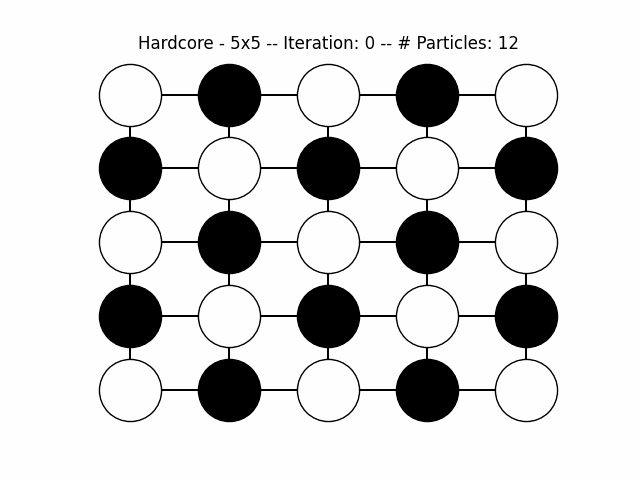

In [ ]:
Image(filename='hardcore_5x5_400iter_alternating.GIF')

### Animación para un latice 15x15 con 200 iteraciones desde una configuración factible

In [ ]:
hardcore_model = Hardcore(15, config_type="alternating")
hardcore_model.run(steps=200, animation=True, filename="hardcore_15x15_200iter_alternating.gif")

True

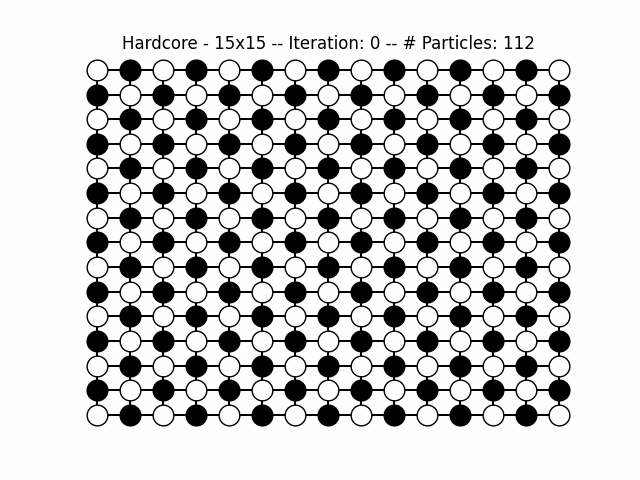

In [ ]:
Image(filename='hardcore_15x15_200iter_alternating.gif')

## Pruebas cortas con otros tamaños de latice:

### Latice 3x3:
Con 100 iteraciones desde una configuración no factible (Todos los nodos con partículas).

En este corto ejemplo vemos como saliendo de una configuración no factible, se cae en las configuraciones factibles y se queda en esta clase.

In [ ]:
hardcore_model = Hardcore(3, config_type="full")
hardcore_model.run(steps=100, animation=True, filename = "hardcore_3x3_100iter_full.gif")

True

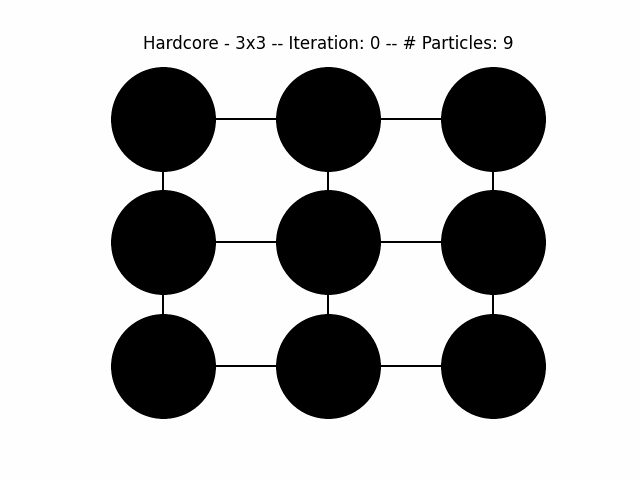

In [ ]:
Image(filename='hardcore_3x3_100iter_full.gif')

### Latice 4x4 con 100 iteraciones partiendo de una configuración sin partículas:

In [ ]:
hardcore_model = Hardcore(4, config_type="empty")
hardcore_model.run(steps=100, animation=True, filename="hardcore_4x4_100iter_empty.gif")

True

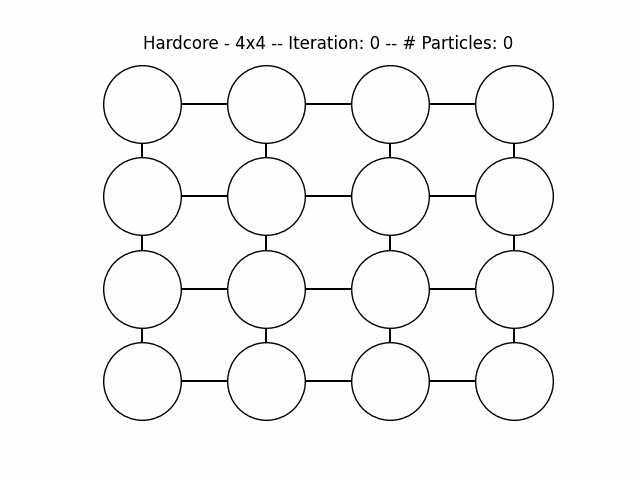

In [ ]:
Image(filename='hardcore_4x4_100iter_empty.gif')

### Latice 6x6 con 100 iteraciones partiendo de una configuración aleatoria (No necesariamente factible)

In [ ]:
hardcore_model = Hardcore(6, config_type="random")
hardcore_model.run(steps=100, animation=True, filename = "hardcore_6x6_100iter_random.gif")

True

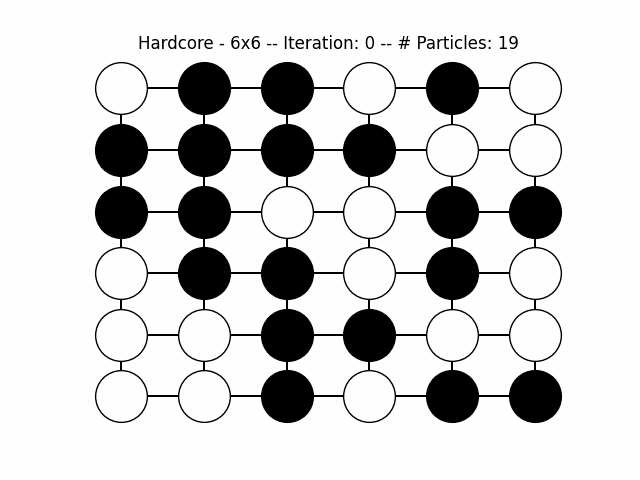

In [ ]:
Image(filename='hardcore_6x6_100iter_random.gif')

### Latice 10x10 con 20 iteraciones partiendo de una configuración sin partículas

Para este caso se mostrará primero la animación interactiva (Requiere la ejecución del notebook) y luego se mostrará el gif.

In [ ]:
# It is necessary to run the notebook
hardcore_model = Hardcore(10, config_type="empty")
hardcore_model.run(steps=20, animation=True)

In [ ]:
hardcore_model = Hardcore(10, config_type="empty")
hardcore_model.run(steps=20, animation=True, filename="harcore_10x10_20iter_empty.gif")

True

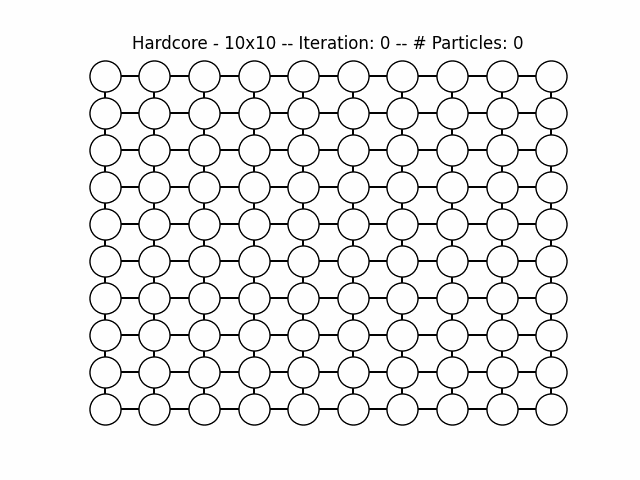

In [ ]:
Image(filename='harcore_10x10_20iter_empty.gif')

### Obtención de muestras sin animación
Igualmente, podemos correr la cadena un número grande de iteraciones para obtener una muestra con una distribución muy aproximada a la requerida.

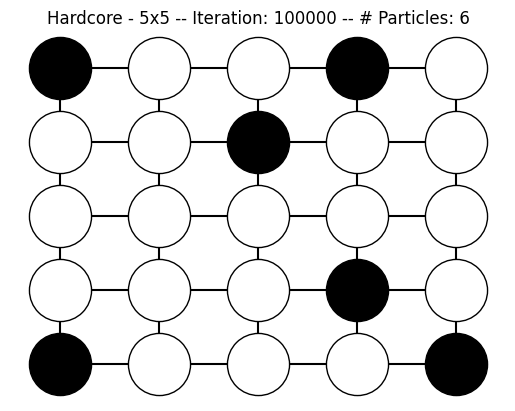

In [ ]:
hardcore_model = Hardcore(5, config_type = "alternating")
hardcore_model.run(steps = 100000, animation = False)
fig, ax = plt.subplots()
hardcore_model.draw(ax)

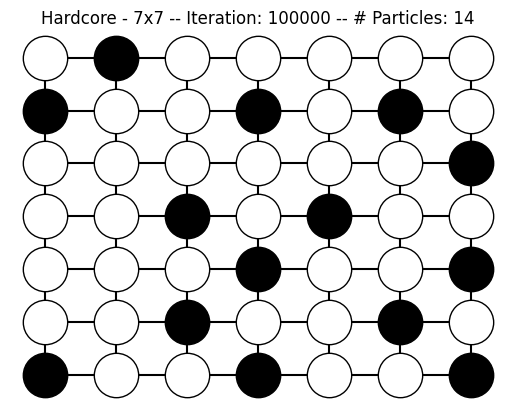

In [ ]:
hardcore_model = Hardcore(7, config_type = "alternating")
hardcore_model.run(steps = 100000, animation = False)
fig, ax = plt.subplots()
hardcore_model.draw(ax)

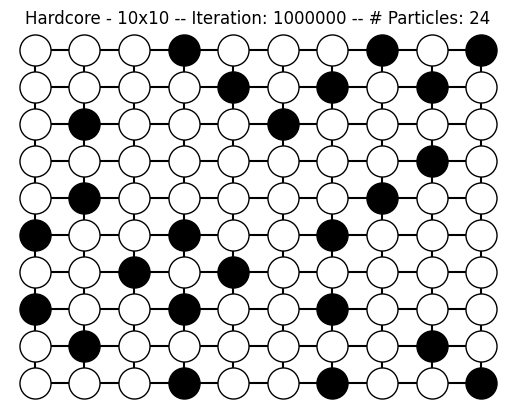

In [ ]:
hardcore_model = Hardcore(10, config_type = "alternating")
hardcore_model.run(steps = 1000000, animation = False)
fig, ax = plt.subplots()
hardcore_model.draw(ax)

# 2. Número de partículas "típico"
Usar muestras generadas con lo hecho en el ejercicio anterior para estimar el número de partículas "típico" que tiene una configuración factible en la rejilla k x k.

Verificar como cambia el histograma si en el punto 1) se toman en vez de X_{10000} ó X_{100000}, otros tiempos de la cadena {X_t}

In [ ]:
def plot_particle_distribution(size=5, num_trials=1000, steps=10000, config_type="alternating", title = ""):
    num_particles = []

    for _ in range(num_trials):
        hardcore_model = Hardcore(size, config_type=config_type)
        hardcore_model.run(steps=steps, animation=False)
        num_particles.append(hardcore_model.particles)

    plt.hist(num_particles, bins=np.arange(min(num_particles), size**2 + 1 + 1.5) - 0.5, density=True, edgecolor='black', alpha=0.7)

    mu, std = norm.fit(num_particles)
    xmin, xmax = plt.xlim()
    x = np.linspace(xmin, xmax, 100)
    p = norm.pdf(x, mu, std)
    plt.plot(x, p, 'k', linewidth=2)

    plt.xlabel('Number of Particles')
    plt.ylabel('Relative frecuency')
    plt.title(title)
    plt.grid(False)
    plt.xticks(np.arange(min(num_particles), max(num_particles) + 1))
    plt.show()

A continuación vamos a ver las distribuciones para varios tamaños de latice, en general se comportan como una gausiana corrida a la izquierda lo cual es de esperarse pues hay restricciones en poner muchas partículas juntas. 

El comportamiento es simialr sin importat el tamaño del latice, sin embargo el centro de la gaussiana no tiene el mismo comportamiento al ir aumentando el tamaño. De forma cualitativa, vemos que con 3x3 la media está cerca a 1/4 del número de particulas posibles sin restricción (número de nodos) y a medida que aumenta el tamaño el centro de la gausiana se corre más a la izquierda. Esto último nos puede indicar que la media de partículas y el tamaño del latice no tienen una relacción lineal y vamos a ver cuál comportamiento tienen después de ver los histogramas con diferentes tamaños.

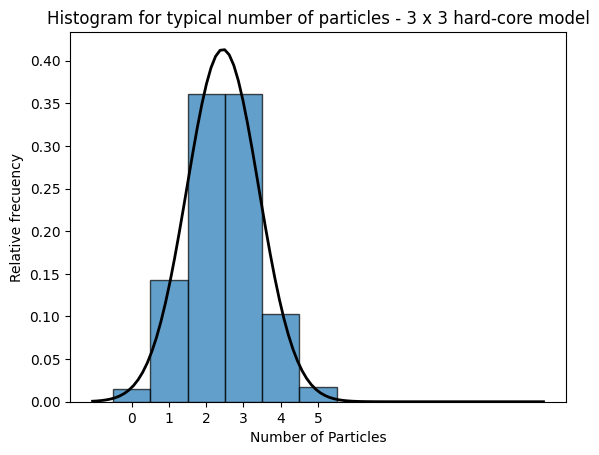

In [ ]:
plot_particle_distribution(size=3, num_trials=1000, steps=10000, config_type="alternating", title ="Histogram for typical number of particles - 3 x 3 hard-core model")

Para en anterior caso, podemos tomar un menor número de iteraciones por muestra y nos encontramos que con solo 100 iteraciones el resultado es muy similar. Esto puede deberse a que como vimos en la animación que parte de una configuración no factible, el caso 3x3 podría entonces estar convergiendo rápidamente.

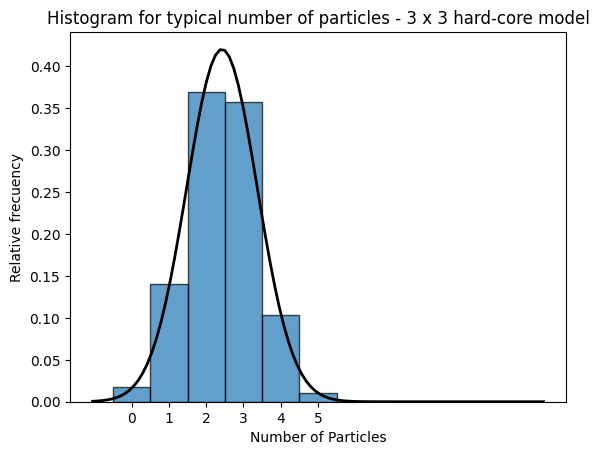

In [ ]:
plot_particle_distribution(size=3, num_trials=1000, steps=100, config_type="alternating", title ="Histogram for typical number of particles - 3 x 3 hard-core model")

Por otro lado tenemos un número grande de muestras, podemos ver que pasa si este número de muestras disminuye.

En el siguiente gráfico vemos el resultado obtenido, logrando un resultado con comportamiento similar.

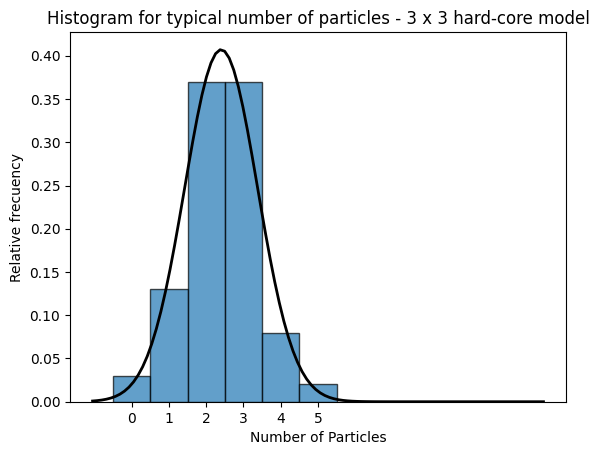

In [ ]:
plot_particle_distribution(size=3, num_trials=100, steps=100, config_type="alternating", title ="Histogram for typical number of particles - 3 x 3 hard-core model")

Veamos para el caso 5x5:

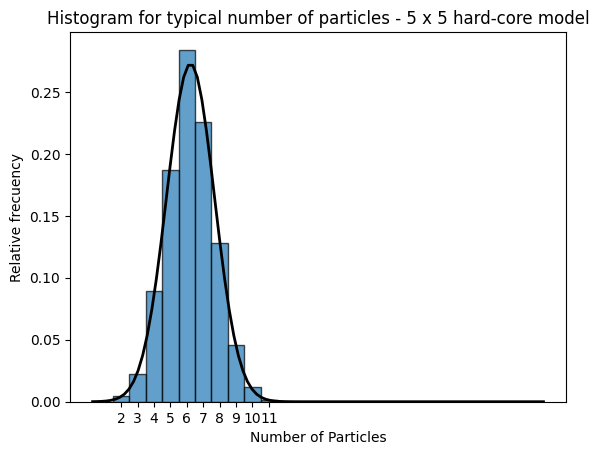

In [ ]:
plot_particle_distribution(size=5, num_trials=1000, steps=10000, config_type="alternating", title ="Histogram for typical number of particles - 5 x 5 hard-core model")

Hagamos una reducción del número de muestras y de iteraciones por muestra:

A diferencia del 3x3, acá vemos un cambio más prominente, en donde el comportamiento similar a una distribución normal se ve afectado.

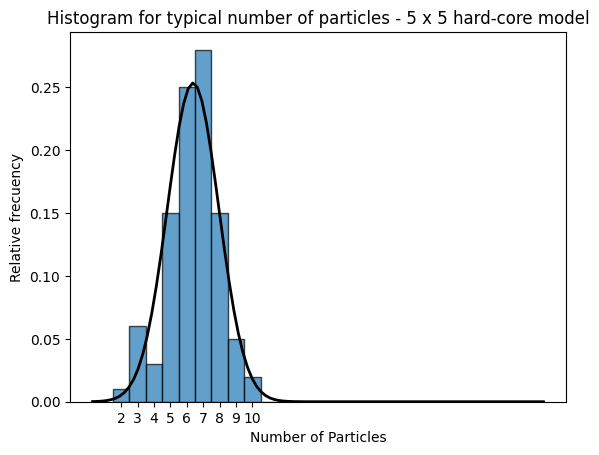

In [ ]:
plot_particle_distribution(size=5, num_trials=100, steps=100, config_type="alternating", title ="Histogram for typical number of particles - 5 x 5 hard-core model")

Finalmente, veamos las distribuciones para otros tamaños:

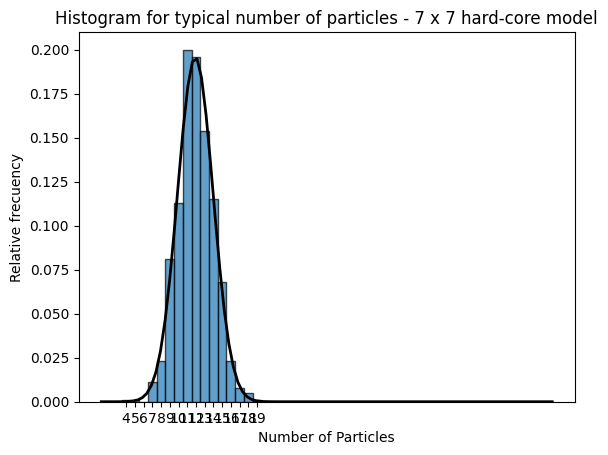

In [ ]:
plot_particle_distribution(size=7, num_trials=1000, steps=1000, config_type="alternating", title ="Histogram for typical number of particles - 7 x 7 hard-core model")

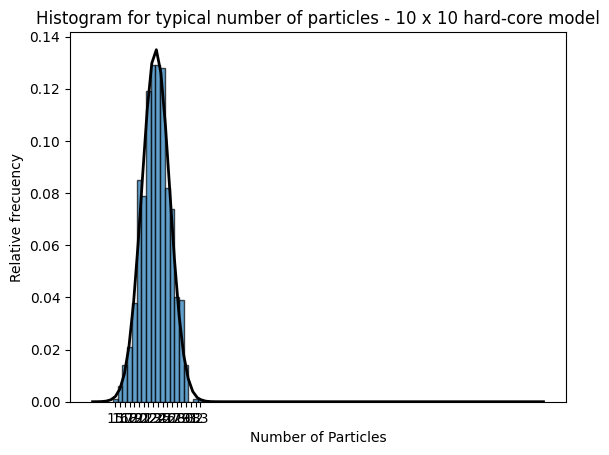

In [ ]:
plot_particle_distribution(size=10, num_trials=1000, steps=10000, config_type="alternating", title ="Histogram for typical number of particles - 10 x 10 hard-core model")

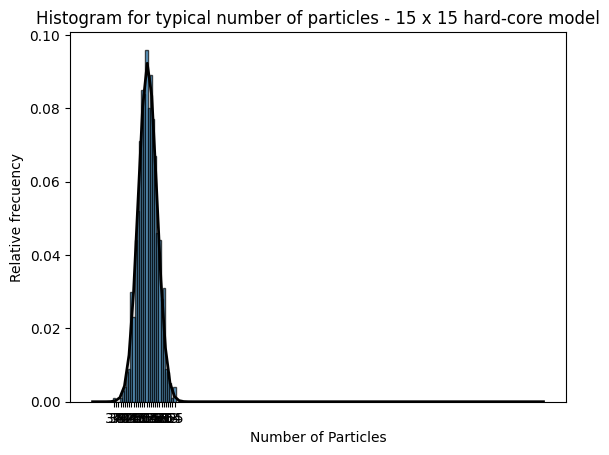

In [ ]:
plot_particle_distribution(size=15, num_trials=1000, steps=10000, config_type="alternating", title ="Histogram for typical number of particles - 15 x 15 hard-core model")

### Comportamiento del valor esperado de número de partículas según el tamaño del latice

Con el muestreo de Gibbs podemos aproximar el valor esperado con el promedio de las muestras, obteniendo el comportamiento exponencial que se ve en la siguiente gráfica.

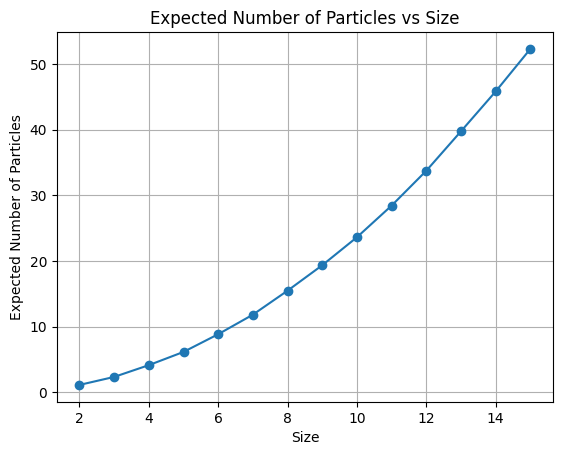

In [ ]:
def plot_expected_values(size_range=(2, 15), num_trials=1000, steps=10000, config_type="alternating"):
    sizes = range(size_range[0], size_range[1] + 1)
    expected_values = []

    for size in sizes:
        num_particles = []

        for _ in range(num_trials):
            hardcore_model = Hardcore(size, config_type=config_type)
            hardcore_model.run(steps=steps, animation=False)
            num_particles.append(hardcore_model.particles)

        expected_values.append(np.mean(num_particles))

    plt.plot(sizes, expected_values, marker='o', linestyle='-')
    plt.xlabel('Size')
    plt.ylabel('Expected Number of Particles')
    plt.title('Expected Number of Particles vs Size')
    plt.grid(True)
    plt.show()

plot_expected_values()

### Caida en configuraciones factibles iniciando la simulación con todos los nodos con partículas

Podemos intentar observar que tantas iteraciones son necesarias para caer en configuraciones factibles iniciando en una no factible como aquella que tiene partículas en todos sus nodos.

In [ ]:
def find_feasible_iteration(size, num_simulations):
    feasible_iterations = []

    for _ in range(num_simulations):
        hardcore = Hardcore(size, config_type="full")
        iteration = 0

        while not hardcore.is_feasible():
            hardcore.update()
            iteration += 1

        feasible_iterations.append(iteration)

    return feasible_iterations

def plot_histogram(data, size):
    plt.hist(data, bins=range(max(data) + 1), align='left', rwidth=0.8)
    plt.title(f'Iterations to Feasibility for {size}x{size} Lattices')
    plt.xlabel('Iterations')
    plt.ylabel('Frequency')
    plt.show()


**Para latices 3x3 con 10000 muestras**

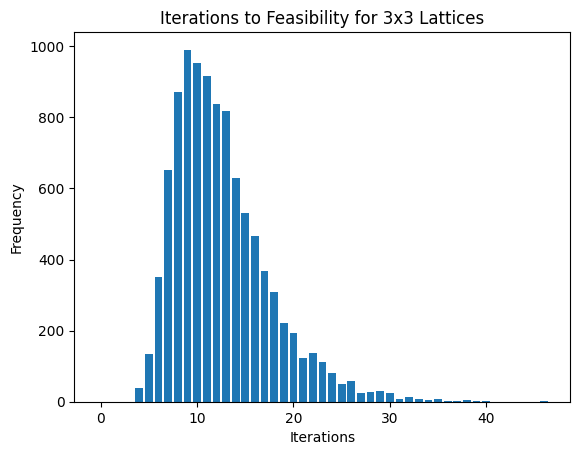

In [ ]:
num_simulations = 10000
size = 3

feasible_iterations = find_feasible_iteration(size, num_simulations)
plot_histogram(feasible_iterations, size)

**Para latices 5x5 con 10000 muestras**

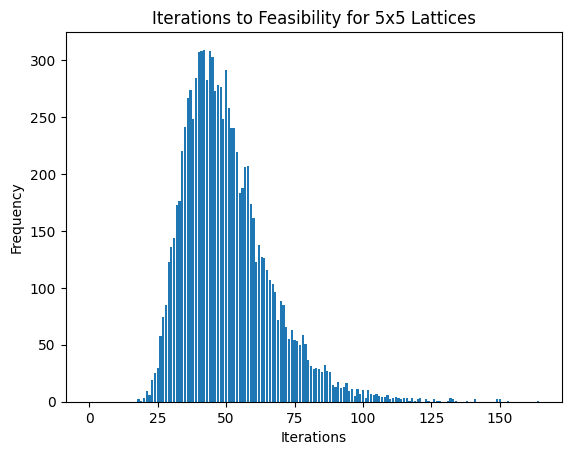

In [ ]:
num_simulations = 10000
size = 5

feasible_iterations = find_feasible_iteration(size, num_simulations)
plot_histogram(feasible_iterations, size)

**Para latices 10x10 con 10000 muestras**

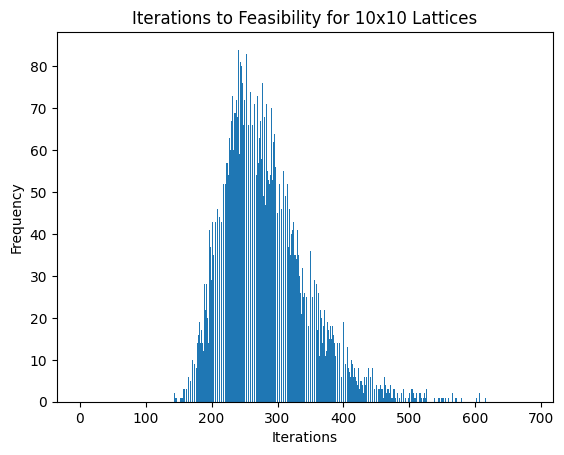

In [ ]:
num_simulations = 10000
size = 10

feasible_iterations = find_feasible_iteration(size, num_simulations)
plot_histogram(feasible_iterations, size)

Observado los tres casos graficados, es posible suponer que esta variable podría tener una distribución log-normal.

# 3. Modelo para q-Coloraciones

Replicar lo hecho en 1) para q-coloraciones (aproximadamente $2\leq q \leq 10$, $3 \leq k \leq 10$).


**Algoritmo**
1. Escoge un vértice $v \in V$ al azar (uniformemente).
2. Escoge $X_{n+1}(v)$ de acuerdo a la distribución uniforme sobre el conjunto de colores que no se encuentran en ninguno de los vecinos de $v$.
3. Deja el color sin cambios en todos los otros vértices, es decir, deja $X_{n+1}(w) = X_n(w)$ para todos los vértices $w \in V$ excepto $v$.


Para modelar la q-Coloraciones se siguió un esquema similar al del hard-core. Se arregló el segundo pasó del algoritmo para elegir de forma uniforme entre los colores validos para un nodo, según los vecinos.

Se hizo también un conteo de la cantidad de nodos con el color asociado al número 1, de forma analoga al conteo del número de partículas en el modelo hard-core.

Las posibles configuraciones que se dejaron para este modelo fueron una configuración alternante con los dos primeros colores (factible) y una configuración llena del color asociado a 1 (no factible).

Cuando la cadena comienza en la configuración no factible, hay ciertas combinaciones de $k$ y $q$ que no permiten a la cadena caer en configuraciones factibles para algunas simulaciones, se detallará en los ejemplos del uso de la implementación del modelo.

In [ ]:
def interval_map(k, x):
        return bisect.bisect_right(np.linspace(0,1,k+1),x)-1 if x != 1 else k-1

class QColoration:

    def __init__(self, size, q, config_type = "alternating"):
        self.size = size
        self.q = q
        self.iteration = 0
        self.converge = True
    
        if config_type == "full":
            self.lattice = np.ones((size,size), dtype = int)
        elif config_type == "alternating":
            self.lattice = np.zeros((size, size), dtype=int)
            self.lattice[1::2, ::2] = 1
            self.lattice[::2, 1::2] = 1
            
        self.colors = self.assign_colors(q)
        # Number of particles of color "1" in the lattice
        self.particles = np.sum(self.lattice)
    

    def assign_colors(self, q):
        cmap = plt.cm.get_cmap('tab10', q)
        colors = {i: cmap(i) for i in range(q)}
        return colors

    def select_random_node(self):
        node = np.random.randint(1, self.size**2+1)
        i = (node - 1) // self.size
        j = (node - 1) % self.size
        return np.array([i,j])

    def update(self):
        self.iteration +=1

        if self.iteration > 0:
            node = self.select_random_node()
            old_color = self.lattice[node[0], node[1]]
            coin = np.random.uniform(0,1)

            neighbors = [(0,1), (1,0), (-1,0), (0, -1)]
            banned_colors = set()
            for change in neighbors:
                neighbor = (node[0] + change[0], node[1] + change[1])

                if neighbor[0]>=0 and neighbor[1]>=0 \
                    and neighbor[0]<=self.size - 1 and neighbor[1]<=self.size - 1:
                    banned_colors.add(self.lattice[neighbor])

            colors = self.colors.copy()
            

            for index in sorted(banned_colors, reverse=True):
                colors.pop(index)
            
            if (len(list(colors.keys())) > 0):
            
                new_color = list(colors.keys())[interval_map(len(colors), coin)]
                    
                self.lattice[node[0], node[1]] = new_color
                if old_color == 1:
                    if new_color != 1:
                        self.particles -= 1
                else:
                    if new_color == 1:
                        self.particles += 1
                return True
            else:
                return False



    def draw(self, ax):

        for i in range(self.size):
            for j in range(self.size):
                if i > 0:
                    ax.plot([j, j], [self.size - i, self.size - i + 1], color='black', zorder=0)
                if j > 0:
                    ax.plot([j, j - 1 ], [self.size - i , self.size - i ], color='black', zorder=0)

        for i in range(self.size):
            for j in range(self.size):
                state = self.lattice[i,j]
                color = self.colors[state]
                #ax.annotate(state, (j, self.size - i), color='black', weight='bold', fontsize=12, ha='center', va='center', zorder=2)  
                ax.scatter(j, self.size - i, s = 5e4/self.size**2, marker = 'o', edgecolors = 'black', color = color, zorder=1)
                

               
        ax.set_xlim(-0.5, self.size - 0.5)
        ax.set_ylim(0.5, self.size + 0.5)
        ax.axis('off')
        ax.set_title(f'{self.q}-Coloration - {self.size}x{self.size} -- Iteration: {self.iteration} -- # Particles (Color "1"): {self.particles}')

    def run(self, steps, animation = False, filename=None, skip_no_colors = False):
        if animation:
            self.iteration = -2
            fig, ax = plt.subplots()
            def update(frame):
                ax.clear()
                if self.converge or skip_no_colors:
                    if self.iteration >0:
                        self.converge = self.update()
                        animation.event_source.stop()
                    else:
                        self.update()
                else:
                    warnings.warn("The markov chain would fail to fall into a feasible configuration")
                self.draw(ax)
            animation = FuncAnimation(fig, update, frames = range(steps+1))
            if filename:
                animation.save(filename, writer='pillow', fps=10)
                plt.close(fig)
                return True
            else:
                html = HTML(animation.to_jshtml())
                plt.close(fig)
                return html
        else:
            for _ in range(steps):
                if not self.update():
                    warnings.warn("The markov chain would fail to fall into a feasible configuration")
                    if not skip_no_colors:
                        break
        

### Animación para latice 5x5 con 5 colores desde una configuración factible (Alternante)

Es claro que partiendo desde una configuración factible no vamos a tener problemas pues siempre pasamos a otra configuración factible.

In [ ]:
qcoloration_model = QColoration(5, 5, config_type = "alternating")
qcoloration_model.run(steps = 100, animation = True, filename = "qcoloration_5x5_100iter_alternating.gif")

True

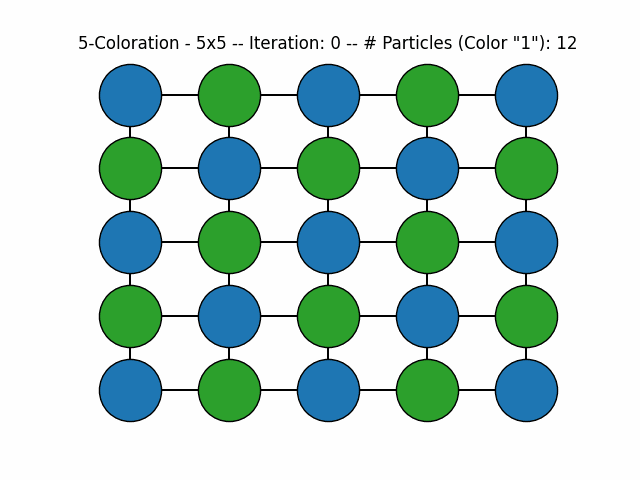

In [ ]:
Image(filename='qcoloration_5x5_100iter_alternating.gif')

### Animación de los últimos 100 estados tras 10000 iteraciónes

In [ ]:
qcoloration_model = QColoration(5, 5, config_type = "alternating")
qcoloration_model.run(steps = 10000)
qcoloration_model.run(steps = 100, animation = True, filename = "qcoloration_5x5_100iter_alternating_last100.gif")

True

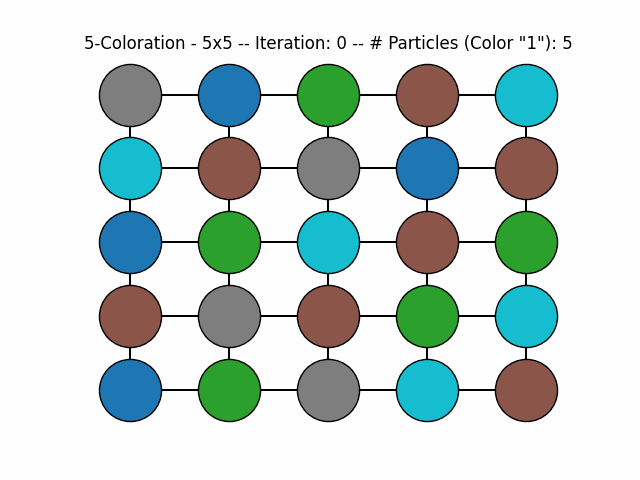

In [ ]:
Image(filename='qcoloration_5x5_100iter_alternating_last100.gif')

### Animación de latice 5x5 con 3 colores desde una configuración no factible

In [ ]:
qcoloration_model = QColoration(5, 3, config_type = "full")
qcoloration_model.run(steps = 30, animation = True, filename = "qcoloration_5x5_100iter_full.gif")

/tmp/ipykernel_44/1543516555.py:111: UserWarning: The markov chain would fail to fall into a feasible configuration
  warnings.warn("The markov chain would fail to fall into a feasible configuration")


True

En la siguiente simulación vemos que aunque se mandaron 30 iteraciones, solo llega a la iteración número 11, pues en ese momento en alguno de los nodos no hay colores disponibles, paramos la cadena en este punto con motivos ilustrativos pero es posible seguir con la cadena de markov no haciendo nada en ese paso, esto es controlado con el parámetro "skip_no_colors".

Al aparecer un punto en el que no se puede asignar un color con las reglas dadas, se anuncia: *"The markov chain would fail to fall into a feasible configuration"*

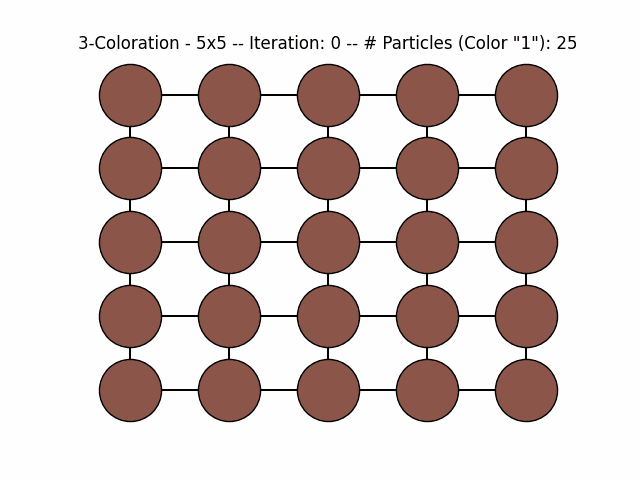

In [ ]:
Image(filename='qcoloration_5x5_100iter_full.gif')

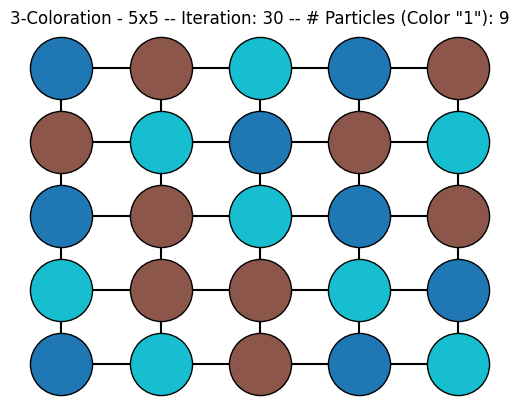

In [ ]:
qcoloration_model = QColoration(5, 3, config_type = "full")
qcoloration_model.run(steps = 30, animation = True, filename = "qcoloration_5x5_100iter_full_skip.gif", skip_no_colors = "True")
fig, ax = plt.subplots()
qcoloration_model.draw(ax)

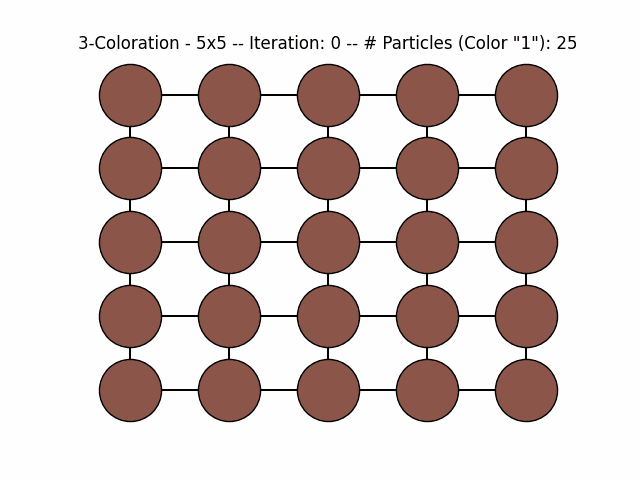

In [ ]:
Image(filename='qcoloration_5x5_100iter_full_skip.gif')

Pero sigamos este misma cadena 10000 iteraciones mas para ver si logró caer en una configuración factible:

In [ ]:
qcoloration_model.run(steps = 10000, skip_no_colors = "True")

/tmp/ipykernel_44/1543516555.py:125: UserWarning: The markov chain would fail to fall into a feasible configuration
  warnings.warn("The markov chain would fail to fall into a feasible configuration")


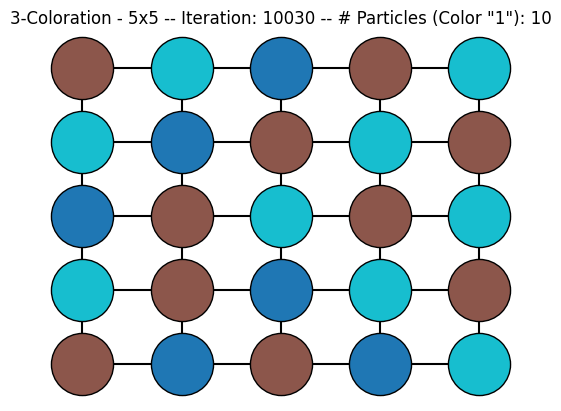

In [ ]:
fig, ax = plt.subplots()
qcoloration_model.draw(ax)

Es evidente que la anterior es una configuración no factible, con lo que es posible ver que incluso tras 10030 iteraciones, la cadena de Markov no logra caer en una configuración factible.

Veamos un ejemplo con 4 colores, sin animación, solo viendo el último estado tras 1000 iteraciones.

Se logra caer en una configuración factible, sin embargo existen casos en los que no. Llegar a estos casos no fue posible repetidamente, pero fueron observados.

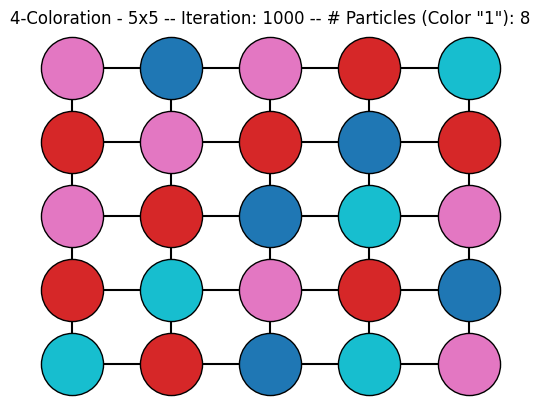

In [ ]:
qcoloration_model = QColoration(5, 4, config_type = "full")
qcoloration_model.run(steps = 1000, skip_no_colors = "True")
fig, ax = plt.subplots()
qcoloration_model.draw(ax)

### Animación para latice 10x10 con 10 colores con 100 iteraciones desde una configuración factible

In [ ]:
qcoloration_model = QColoration(10, 10)
qcoloration_model.run(steps = 100, animation = True, filename='qcoloration_10x10_10cor_100iter.gif')

True

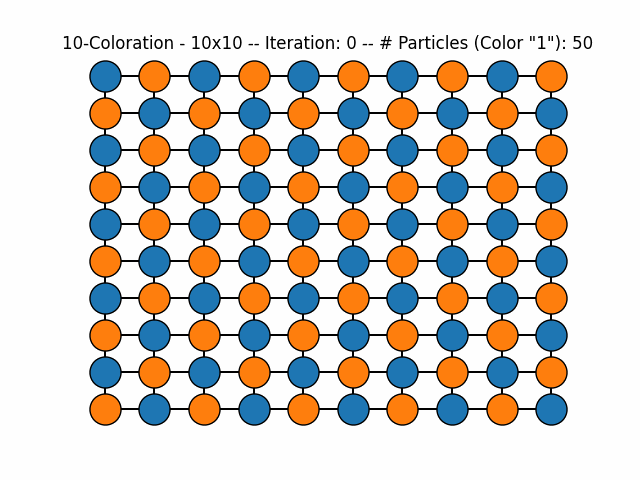

In [ ]:
Image(filename='qcoloration_10x10_10cor_100iter.gif')

Veamos el estado al que llega tras completar las 100000 iteraciones:

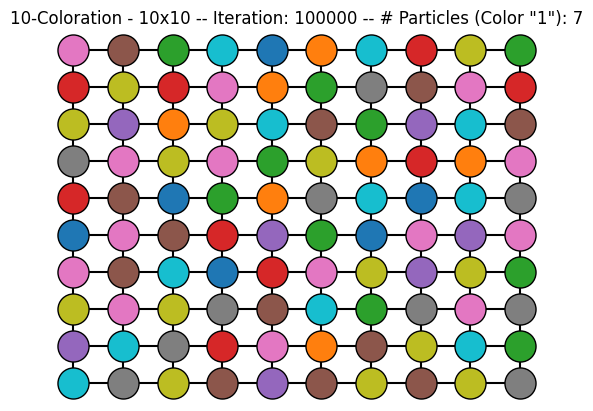

In [ ]:
qcoloration_model.run(steps = 99900)
fig, ax = plt.subplots()
qcoloration_model.draw(ax)

## Número típico de nodos con un color fijo

Para q-Coloraciones, podemos hacer algo similar que con el modelo hard-core y hacer un conteo de cuantos nodos tienen un color, logrando llegar a la distribución de esta variable aleatoria.

In [ ]:
def plot_one_color_distribution(size=5, colors=2, num_trials=1000, steps=10000, title = ""):
    num_particles = []

    for _ in range(num_trials):
        qcoloration_model = QColoration(size, colors)
        qcoloration_model.run(steps=steps, animation=False)
        num_particles.append(qcoloration_model.particles)

    plt.hist(num_particles, bins=np.arange(min(num_particles), size**2 + 1 + 1.5) - 0.5, density=True, edgecolor='black', alpha=0.7)

    mu, std = norm.fit(num_particles)
    xmin, xmax = plt.xlim()
    x = np.linspace(xmin, xmax, 100)
    p = norm.pdf(x, mu, std)
    plt.plot(x, p, 'k', linewidth=2)

    plt.xlabel('Number of Particles with Color 1')
    plt.ylabel('Relative frecuency')
    plt.title(title)
    plt.grid(False)
    plt.xticks(np.arange(min(num_particles), max(num_particles) + 1))
    plt.show()

Veamos un ejemplo del número de nodos con el color fijado (Asociado al número 1) para una **3-coloración, 5-coloración y 10 coloración de 10x10**. Las gráficas nos muestran que entre más colores, el número de particulas con este color fijo disminuyen.

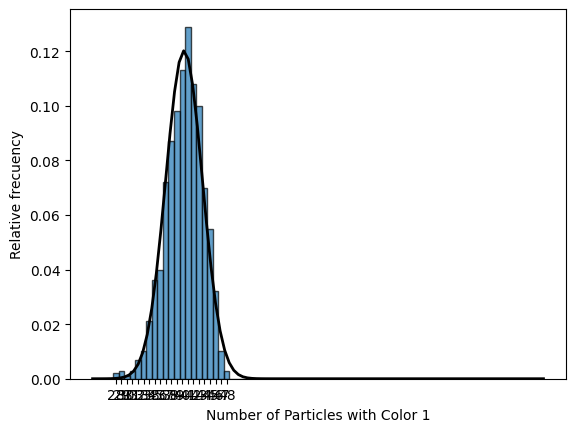

In [ ]:
plot_one_color_distribution(size=10, colors=3, num_trials=1000, steps=100, title = "")

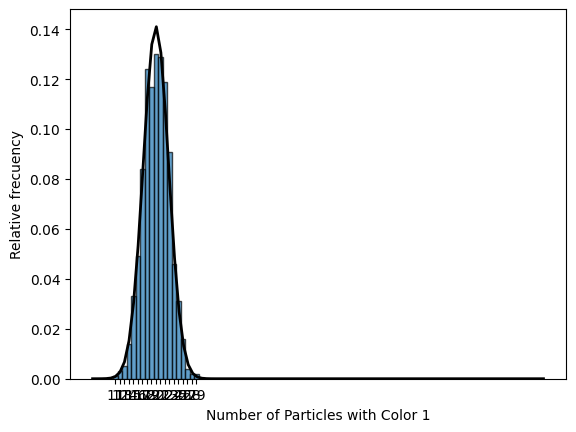

In [ ]:
plot_one_color_distribution(size=10, colors=5, num_trials=1000, steps=1000, title = "")

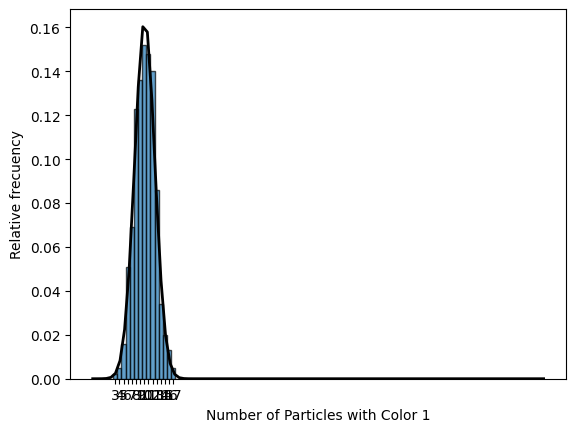

In [ ]:
plot_one_color_distribution(size=10, colors=10, num_trials=1000, steps=1000, title = "")

Al igual que en el modelo hard-core, analizamos el comportamiento del valor esperado de esta variable aleatoria, igualmente parece tener un comportamiento exponencial. A continuación se muestra la gráfica para **5-coloraciones de 5x5 a 15x15.**

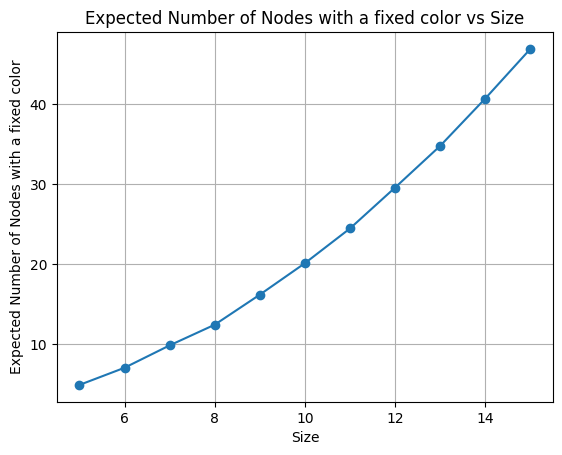

In [ ]:
def plot_expected_values_one_color(size_range=(5, 15), q=5, num_trials=1000, steps=10000, config_type="alternating"):
    sizes = range(size_range[0], size_range[1] + 1)
    expected_values = []

    for size in sizes:
        num_particles = []

        for _ in range(num_trials):
            qcoloration_model = QColoration(size,q, config_type=config_type)
            qcoloration_model.run(steps=steps, animation=False)
            num_particles.append(qcoloration_model.particles)

        expected_values.append(np.mean(num_particles))

    plt.plot(sizes, expected_values, marker='o', linestyle='-')
    plt.xlabel('Size')
    plt.ylabel('Expected Number of Nodes with a fixed color')
    plt.title('Expected Number of Nodes with a fixed color vs Size')
    plt.grid(True)
    plt.show()

plot_expected_values_one_color(num_trials=100, steps=1000)

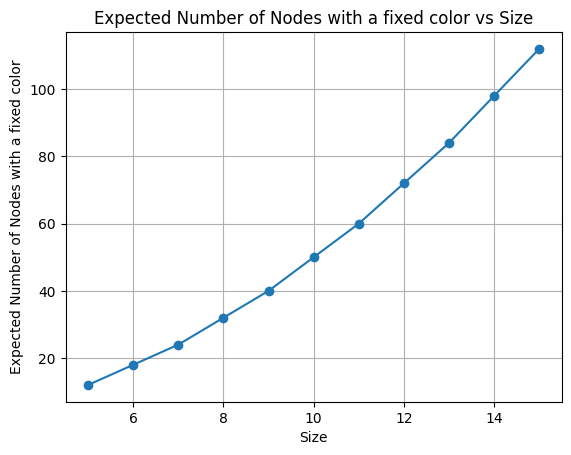

In [ ]:
def plot_expected_values_one_color(size_range=(5, 15), q=5, num_trials=1000, steps=10000, config_type="alternating"):
    sizes = range(size_range[0], size_range[1] + 1)
    expected_values = []

    for size in sizes:
        num_particles = []

        for _ in range(num_trials):
            qcoloration_model = QColoration(size,q, config_type=config_type)
            qcoloration_model.run(steps=steps, animation=False)
            num_particles.append(qcoloration_model.particles)

        expected_values.append(np.mean(num_particles))

    plt.plot(sizes, expected_values, marker='o', linestyle='-')
    plt.xlabel('Size')
    plt.ylabel('Expected Number of Nodes with a fixed color')
    plt.title('Expected Number of Nodes with a fixed color vs Size')
    plt.grid(True)
    plt.show()

plot_expected_values_one_color(size_range=(5, 15), q=2,num_trials=100, steps=1000)

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=000384fb-d469-402b-98b5-2ce83db988be' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>